In [2]:
## Source Heading Component

## Todo: Classes for Gradient, DQN, PPO

## Todo: Analysis on their performances

## Todo: Detect & maintain stationary state & estimating advection term

In [3]:
import os
import pickle
import random
import copy
import numpy as np
import matplotlib.pyplot as plt
import gym
import torch as th
from collections import OrderedDict
from stable_baselines3 import DQN, PPO
from stable_baselines3.common.evaluation import evaluate_policy
from stable_baselines3.common.callbacks import CheckpointCallback

## Creating Diffusion Field Environments for Training RL-Agent

#### Spatial-Temporal Diffusion Field & Gym Environment

In [4]:
DEFAULT_FIELD_PARAMS = [0, 0, 1.0]     # Vx, Vy, K
DEFAULT_ENV_PARAMS = [1.0, 1.0, 0.1]  # dx, dy, dt

# ---------------------------------------------------------------
# SPATIAL-TEMPORAL DIFFUSION FIELD
# ---------------------------------------------------------------

class SpatialTemporalDiffusionField():
    def __init__(self, pos=(50,50), map_size=100, field_size=40, field_max=25, n_timesteps=None, field_params=DEFAULT_FIELD_PARAMS, env_params=DEFAULT_ENV_PARAMS):
        # initialize field params
        self.dx, self.dy, self.dt = env_params
        self.vx, self.vy, self.k = field_params
        self.field_size, self.field_max, self.map_size = field_size, field_max, map_size
        self.snapshots = None
        # generate field
        field_hsize = field_size // 2
        self.gaussian_field = self.generate_multivariate_gaussian_field(N=field_size)
        self.field = np.zeros((map_size, map_size))
        self.padded_field = np.zeros((3*map_size, 3*map_size))
        x_start, x_end = map_size+pos[0]-field_hsize, map_size+pos[0]+field_hsize
        y_start, y_end = map_size+pos[1]-field_hsize, map_size+pos[1]+field_hsize
        self.padded_field[y_start:y_end, x_start:x_end]=self.gaussian_field
        self.field = self.padded_field[map_size:map_size*2,map_size:map_size*2]
        self.field = (self.field - np.min(self.field)) / (np.max(self.field)-np.min(self.field)) * self.field_max
        # generate snapshots
        if (n_timesteps is not None) and (n_timesteps > 0):
            self.snapshots = np.zeros((n_timesteps,map_size,map_size))
            self.snapshots[0] = self.field
            for i in range(1, n_timesteps):
                self.snapshots[i] = self.update_diffusion_field(self.snapshots[i-1])        
    
    def generate_multivariate_gaussian_field(self, N=40, mu=np.array([0.,0.]), sigma=np.array([[1.,0.],[0.,1.]])):
        X = np.linspace(-3.0, 3.0, N)
        Y = np.linspace(-3.0, 3.0, N)
        X, Y = np.meshgrid(X, Y)
        pos = np.empty(X.shape + (2,))
        pos[:,:,0] = X
        pos[:,:,1] = Y
        n = mu.shape[0]
        sigma_det, sigma_inv = np.linalg.det(sigma), np.linalg.inv(sigma)
        N = np.sqrt((2*np.pi)**n * sigma_det)
        fac = np.einsum('...k,kl,...l->...', pos-mu, sigma_inv, pos-mu)
        return np.exp(-fac / 2) / N
    
    def update_diffusion_field(self, field):
        updated_u = field.copy()
        u_k = field.copy()
        for i in range(1, field.shape[0] - 1):
            for j in range(1, field.shape[1] - 1):
                updated_u[j, i] = u_k[j, i] + self.k * (self.dt / self.dx ** 2) * \
                    ((u_k[j + 1, i] + u_k[j - 1, i] +
                      u_k[j, i + 1] + u_k[j, i - 1] - 4 * u_k[j, i])) + \
                    self.vx * (self.dt / self.dx) * ((u_k[j + 1, i] - u_k[j, i])) + self.vy * (self.dt / self.dy) * \
                    (u_k[j, i + 1] - u_k[j, i])
        return updated_u

In [5]:
# ---------------------------------------------------------------
# SPATIAL-TEMPORAL DIFFUSION ENVIRONMENT
# (consists of multiple diffusion fields)
# ---------------------------------------------------------------

class SpatialTemporalDiffusionEnvironment():
    def __init__(self, name, configs=[], env_params=DEFAULT_ENV_PARAMS, size=100, use_snapshots=True, n_timesteps=300):
        self.name = name
        self.field_size = size
        self.configs = configs
        self.dx, self.dy, self.dt = env_params
        self.n_timesteps = n_timesteps
        self.fields=[]
        self.timestep = 0
        for idx, config in enumerate(configs):
            self.fields.append(SpatialTemporalDiffusionField(pos=config['pos'], field_size=config['size'], field_params=config['params'], \
                    env_params=env_params, map_size=size, n_timesteps=n_timesteps if use_snapshots else None))
        self.set_timestep()
    
    def set_timestep(self, t=0):
        self.isolated_field_states = np.array([self.fields[i].snapshots[t] for i in range(len(self.fields))])
        self.env_field = np.sum(self.isolated_field_states, axis=0)
        self.timestep = t
        
    def step(self):
        if self.timestep < self.n_timesteps:
            self.set_timestep(self.timestep + 1)
        
    def get_single_field(self, idx=0):
        if (idx>=0) and (idx<len(self.fields)):
            return self.isolated_field_states[idx]
        else:
            return None
        
    def compute_gradient(self, pos=[50,50]):
        dz_dx = (self.env_field[pos[1], pos[0]+1] -
                 self.env_field[pos[1], pos[0]-1]) / (2 * self.dx)
        dz_dy = (self.env_field[pos[1]+1, pos[0]] -
                 self.env_field[pos[1]-1, pos[0]]) / (2 * self.dy)
        return np.array([dz_dx, dz_dy])
    
    def get_concentration(self, pos=[50,50]):
        return self.env_field[pos[1],pos[0]]

In [6]:
# ---------------------------------------------------------------
# SPATIAL-TEMPORAL DIFFUSION FIELD GYM WRAPPER
# ---------------------------------------------------------------

ACTION_MAP = {0:"left",1:"right",2:"up",3:"down",4:"stay",5:"up-left",6:"up-right",7:"down-left",8:"down-right"}
ACTIONS = ["left", "right", "up", "down", "stay", "up-left", "up-right", "down-left", "down-right"]
ACTION_OFFSET = np.array([[-1,0],[1,0],[0,-1],[0,1],[0,0],[-1,-1],[1,-1],[-1,1],[1,1]])
# DEFAULT_START_POSITIONS = [[50,20],[50,80],[20,50],[80,50],[25,25],[75,75]]

class SpatialTemporalDiffusionEnvGymWrapper(gym.Env):
    
    def __init__(self, envs=[], max_steps=299, vs_hsize=5, spawn_pos_range=[1.2,1.5], keep_env_on_reset=False):
        metadata = {'render.modes': ['human']}
        super(SpatialTemporalDiffusionEnvGymWrapper, self).__init__()
        
        self.envs = envs
        self.env = random.choice(envs)
        self.keep_env_on_reset = keep_env_on_reset
        
        assert self.env.n_timesteps >= max_steps, f"max numsteps should not exceed max snapshots of this env"
                    
        self.max_steps = max_steps
        self.vs_hsize = vs_hsize
        self.spawn_pos_range = spawn_pos_range
        
        # Agent Field related params/variables
        self.agent_position = None
        self.num_steps = 0

        # Action Space
        self.action_space_map = ACTION_MAP
        self.actions = ACTIONS
        self.action_offsets = ACTION_OFFSET
        self.action_space = gym.spaces.Discrete(9)

        # Observation Space
        low = np.array([0.0, -100.0, -100.0])
        high = np.array([25.0, 100.0, 100.0])
        self.observation_space = gym.spaces.Box(low, high, dtype=np.float64)
        
    def step(self, action_id):
        # Ensure action is a valid action and exists in Agent's action space
        assert self.action_space.contains(action_id), "Action %r (%s) is invalid!" % (action_id, type(action_id))        
        action = self.action_space_map[action_id]

        # Get the next state
        (hit_wall, next_position) = self.get_next_position(action_id)
        if (hit_wall):
            # Stay at the same place if hitting boundary
            next_position = self.agent_position

        # Update field state
        self.env.step()
        
        # Update number of steps
        self.num_steps += 1

        # Update agent variables
        self.agent_position = next_position

        # Get concentration
        self.concentration = self.env.get_concentration(self.agent_position)
        self.gradients = self.env.compute_gradient(self.agent_position)        
        next_state = [self.concentration, self.gradients[0], self.gradients[1]]
        
        # Check for termination criteria
        done = self.num_steps >= self.max_steps
        reward = self.calculate_reward(next_position, self.gradients)

        # Get any observations
        observations = {"location": next_position}
        
        return (next_state, reward, done, observations)
    
    def get_random_start_position(self):
        in_range = (self.env.env_field>=self.spawn_pos_range[0]) & (self.env.env_field<=self.spawn_pos_range[1])
        return np.flip(random.choice(np.transpose(np.nonzero(in_range))))
    
    def reset(self, pos=None):
        if not self.keep_env_on_reset:
            self.env = random.choice(self.envs)
            assert self.env.n_timesteps >= self.max_steps, f"max numsteps should not exceed max snapshots of this env"
        self.num_steps = 0
        self.env.set_timestep()
        self.agent_position = pos if pos is not None else self.get_random_start_position()
        self.concentration = self.env.get_concentration(self.agent_position)
        self.gradients = self.env.compute_gradient(self.agent_position)
        observations = {"location": self.agent_position}
        next_state = [self.concentration, self.gradients[0], self.gradients[1]]
        return next_state

    def get_next_position(self, action_id):
        # Create a deepcopy of current state
        next_state = copy.deepcopy(self.agent_position)
        next_state = np.add(next_state, ACTION_OFFSET[action_id])

        # Check for collisions
        hit_wall = False
        if ((next_state[0] < (0 + self.vs_hsize) or next_state[0] >= (self.env.field_size - self.vs_hsize)) or
            ((next_state[1] < (0 + self.vs_hsize) or next_state[1] >= (self.env.field_size - self.vs_hsize)))):
            hit_wall = True

        return (hit_wall, next_state)
    
    def get_viewscope_state(self, next_state):
        vs_min_row, vs_max_row = next_state[0] - self.vs_hsize, next_state[0] + self.vs_hsize + 1
        vs_min_col, vs_max_col = next_state[1] - self.vs_hsize, next_state[1] + self.vs_hsize + 1
        vs_state = self.env.env_field[vs_min_col:vs_max_col, vs_min_row:vs_max_row]
        return vs_state

    def calculate_reward(self, next_state, gradients):
        reward_from_vs = 1e-2 * np.sum(self.get_viewscope_state(next_state))
        if reward_from_vs < 10:
            return reward_from_vs
        else:
            sum_sq_grad = (gradients[0] ** 2) + (gradients[1] ** 2)
            reward_from_grad = 20 * np.exp(-5 * sum_sq_grad)
            return reward_from_vs + reward_from_grad

## Creating RL-Models for source heading

### 1. DQN Model

In [126]:
class DQN_Agent:

    def __init__(self, env, name='DQN', path='./data/models/', load_saved_model=True):
        self.env = env
        self.name = name
        self.model_path = os.path.join(path, name)
        if load_saved_model and os.path.exists(self.model_path+'.zip'):
            self.model = DQN.load(self.model_path, env=env)
        else:
            self.model = DQN('MlpPolicy', env, verbose=0, tensorboard_log='./data/logs/tensorboard')
    
    def train(self, n_timestep=40_000, eval=True):
        self.model.learn(total_timesteps=n_timestep, progress_bar=False)
        self.model.save(self.model_path)
        if eval:
            mean_reward, std_reward = evaluate_policy(self.model, self.model.get_env(), n_eval_episodes=10)
            print(f'Evaluation ==> mean_reward: {mean_reward}, std_reward: {std_reward}')

    def predict(self, obs):
        action, _ = self.model.predict(np.array(obs))
        return action, _


### 2. PPO Model

In [149]:
class PPO_Agent:

    def __init__(self, env, name='PPO', path='./data/models/', load_saved_model=True):
        self.env = env
        self.name = name
        self.model_path = os.path.join(path, name)
        if load_saved_model and os.path.exists(self.model_path+'.zip'):
            print(f"Loaded saved model at '{self.model_path+'.zip'}'")
            self.model = PPO.load(self.model_path, env=env)
        else:        
            self.model = PPO('MlpPolicy', env, verbose=0, tensorboard_log='./data/logs/tensorboard')
    
    def train(self, n_timestep=40_000, eval=True):
        self.model.learn(total_timesteps=n_timestep, progress_bar=False)
        self.model.save(self.model_path)
        if eval:
            mean_reward, std_reward = evaluate_policy(self.model, self.model.get_env(), n_eval_episodes=10)
            print(f'Evaluation [{self.name}] ==> mean_reward: {mean_reward}, std_reward: {std_reward}')        

    def predict(self, obs):
        action, _  = self.model.predict(np.array(obs))
        return action, _

## Setup Gym Environments

In [7]:
from collections import OrderedDict
DEFAULT_ENV_PARAMS = [0.8, 0.8, 0.1]

### 1. Basic Static Fields

In [8]:
static_field_configs = OrderedDict([
    ('1-src-static-small',[{'pos': (50,50), 'size': 60,   'params': [0.0, 0.0, 1]}]),
    ('1-src-static-mid',  [{'pos': (50,50), 'size': 80,   'params': [0.0, 0.0, 1]}]),
    ('1-src-static-large',[{'pos': (50,50), 'size': 100,  'params': [0.0, 0.0, 1]}]),
])

static_envs = [SpatialTemporalDiffusionEnvironment(name, configs=static_field_configs[name]) for idx,name in enumerate(static_field_configs.keys())]

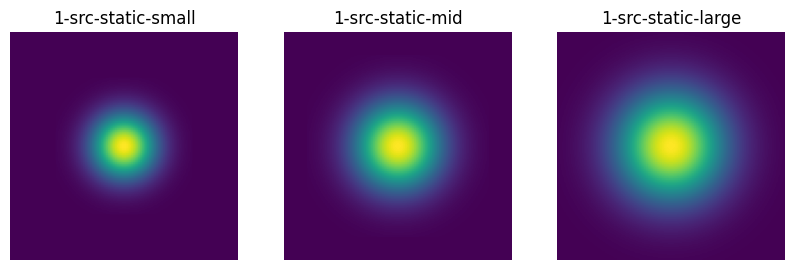

In [9]:
fig, axes = plt.subplots(1, 3, figsize=(10, 5))
for idx, env in enumerate(static_envs):
    axes[idx].imshow(env.env_field)
    axes[idx].set_title(f"{env.name}")
    axes[idx].axis("off")
plt.show()

### 2. Dynamic Fields

In [98]:
dynamic_field_configs = OrderedDict([
    ('1-src-mid-vel-1',    [{'pos': (50,50), 'size': 80,   'params': [1.0,  0.0, 1]}]),
    ('1-src-mid-vel-2',    [{'pos': (50,50), 'size': 80,   'params': [0.0,  1.0, 1]}]),
    ('1-src-mid-vel-3',    [{'pos': (50,50), 'size': 80,   'params': [-1.0, 0.0, 1]}]),
    ('1-src-mid-vel-4',    [{'pos': (50,50), 'size': 80,   'params': [0.0, -1.0, 1]}]),

])

dynamic_envs = [SpatialTemporalDiffusionEnvironment(name, configs=dynamic_field_configs[name]) for idx,name in enumerate(dynamic_field_configs.keys())]

In [101]:
import matplotlib.animation as animation
from IPython.display import HTML

fig, axes = plt.subplots(1,2, figsize=(10, 5))
ims = []
for step in range(299):
    dynamic_envs[0].set_timestep(t=step)
    dynamic_envs[1].set_timestep(t=step)
    im1 = axes[0].imshow(dynamic_envs[0].env_field, animated=True)
    im2 = axes[1].imshow(dynamic_envs[1].env_field, animated=True)
    ims.append([im1,im2])
axes[0].set_title(dynamic_envs[0].name)
axes[1].set_title(dynamic_envs[1].name)
dynamic_envs[0].set_timestep()
dynamic_envs[1].set_timestep()
ani = animation.ArtistAnimation(fig, ims, interval=50, blit=True, repeat_delay=1000)
plt.close()
HTML(ani.to_jshtml())

## Training RL Models

### 1. Utility for ploting agent trajectory

In [145]:
def plot_traj(env, traj=[]):
    import matplotlib.patches as patches
    fig, ax = plt.subplots()
    print(env)
    ax.set_title(env.env.name)
    ax.set_aspect("equal")
    ax.axis("off")
    ax.imshow(env.env.env_field)
    traj_r = [position[0] for position in traj]
    traj_c = [position[1] for position in traj]
    ax.plot(traj_r, traj_c, '.', color='black')
    ax.plot(traj[0][0], traj[0][1], '*', color='red')
    view_scope_box = patches.Rectangle(
        (traj[-1][0] - env.vs_hsize,
         traj[-1][1] - env.vs_hsize), env.vs_hsize*2+1, env.vs_hsize*2+1,
        linewidth=2, edgecolor='r', facecolor='none')
    ax.add_patch(view_scope_box)
    plt.show()

### 2. Training on Static Maps

In [129]:
# train & evaluate stable-baseline3 model
TRAIN_N_TIMESTEPS = 500_000

env = SpatialTemporalDiffusionEnvGymWrapper(envs=static_envs, max_steps=100)
model = PPO_Agent(env)
model.train(n_timestep=TRAIN_N_TIMESTEPS)

Evaluation [PPO] ==> mean_reward: 3620.1366977000007, std_reward: 132.43336497567938


<SpatialTemporalDiffusionEnvGymWrapper instance>


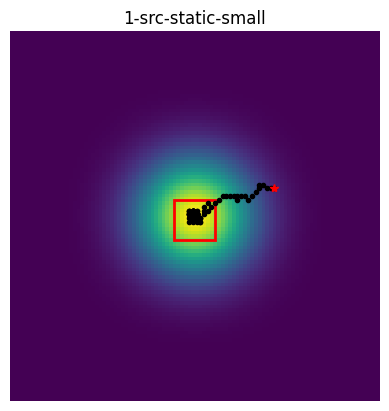

<SpatialTemporalDiffusionEnvGymWrapper instance>


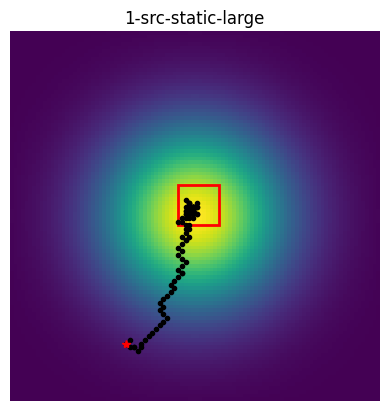

<SpatialTemporalDiffusionEnvGymWrapper instance>


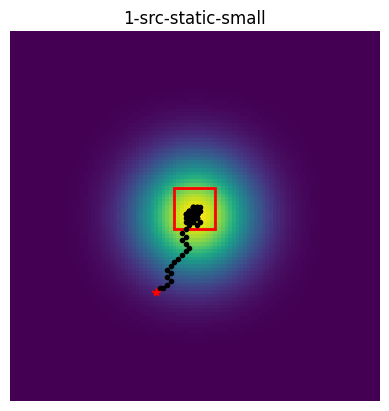

<SpatialTemporalDiffusionEnvGymWrapper instance>


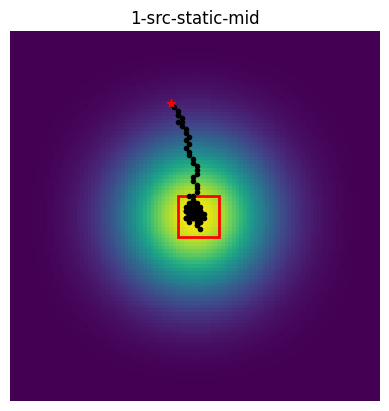

<SpatialTemporalDiffusionEnvGymWrapper instance>


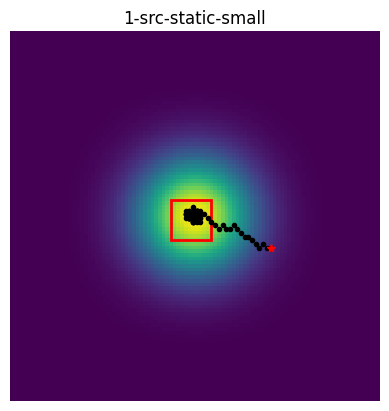

In [148]:
# evaluate
DEFAULT_TEST_EPISODES = 5

for episode_num in range(DEFAULT_TEST_EPISODES):
    state = env.reset()
    traj = []
    while True:
        action, hidden_state = model.predict(state)
        state, reward, done, obsr = env.step(action.item())
        traj.append(obsr['location'])
        if done:
            plot_traj(env=env, traj=traj)
            break

### Train on Dynamic Maps

In [150]:
# train & evaluate stable-baseline3 model
TRAIN_N_TIMESTEPS = 500_000

env = SpatialTemporalDiffusionEnvGymWrapper(envs=dynamic_envs, max_steps=100)
model = PPO_Agent(env)
model.train(n_timestep=TRAIN_N_TIMESTEPS)

Loaded saved model at './data/models/PPO.zip'
Evaluation [PPO] ==> mean_reward: 3720.4089231, std_reward: 101.65870701292592


<SpatialTemporalDiffusionEnvGymWrapper instance>


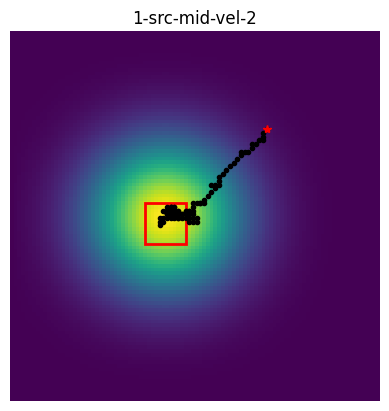

<SpatialTemporalDiffusionEnvGymWrapper instance>


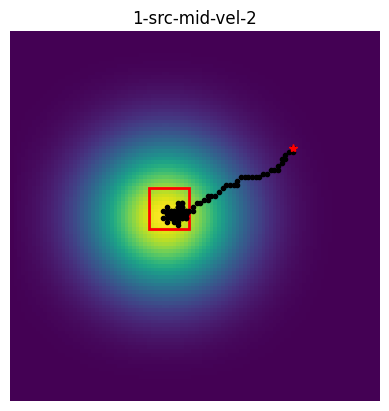

<SpatialTemporalDiffusionEnvGymWrapper instance>


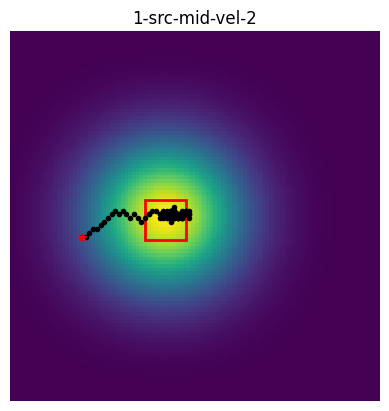

<SpatialTemporalDiffusionEnvGymWrapper instance>


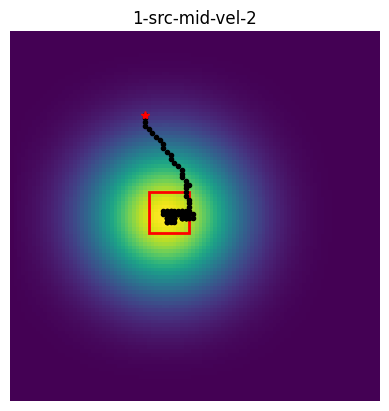

<SpatialTemporalDiffusionEnvGymWrapper instance>


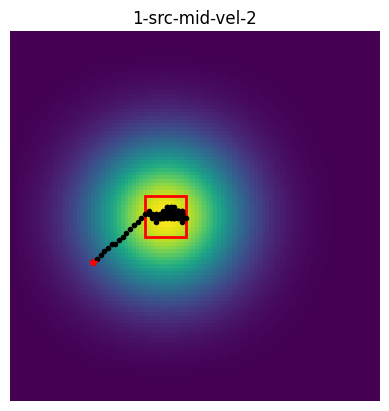

In [151]:
# evaluate
DEFAULT_TEST_EPISODES = 5

for episode_num in range(DEFAULT_TEST_EPISODES):
    state = env.reset()
    traj = []
    while True:
        action, hidden_state = model.predict(state)
        state, reward, done, obsr = env.step(action.item())
        traj.append(obsr['location'])
        if done:
            plot_traj(env=env, traj=traj)
            break

### Estimate Advection Diffusion Params